# Notebook 4: Gate Logic Tuning

This notebook is a small working bench for designing the retention gate. It starts with one known-good reference file, extracts a user-selected section, runs Perch on 5-second windows, and gives us two views of the same evidence:

- a mel spectrogram with frame-level decision evidence aligned underneath it
- a review table with frame start time, the top three Perch labels/logits, and the candidate gate features

This version explores a margin-based biological gate. For each 5-second frame we compare the strongest NZ bird candidate from `labels/north_island_nz_perch_lablel.csv` with the strongest excluded FSD50K noise class in `EXCLUDED_TOP3_LABELS`. A frame is retained only when the NZ bird logit beats the excluded-label logit by `BIO_MARGIN_THRESHOLD`, unless the overall top Perch label is itself one of the excluded labels, which acts as an immediate veto.


## Gate-Tuning Flow

```mermaid
flowchart LR
    A[Reference WAV] --> B[User-selected section]
    B --> C[5-second Perch windows]
    C --> D[Perch CPU V2]
    D --> E[Full Perch logits]
    E --> F[Top NZ bird candidate]
    E --> G[Top excluded noise label]
    E --> H[Overall top label veto]
    F --> I[NZ bird logit - excluded logit]
    G --> I
    I --> J[Margin threshold]
    H --> K[Margin bio gate]
    J --> K
    B --> L[Mel spectrogram]
    E --> M[Top-3 review table]
    K --> N[Gate timeline]
```


## 1. Setup

Run this notebook from the repository root, or from the `notebooks/` directory. The imports below add the repo root to `sys.path` so we can reuse the same Perch helpers as the production mock.

In [128]:
from pathlib import Path
import sys
import time

import numpy as np
import pandas as pd
import soundfile as sf
from scipy.signal import resample_poly, stft

import matplotlib.pyplot as plt
import tensorflow as tf
from matplotlib import patches
from IPython.display import Audio, display

REPO_ROOT = Path.cwd()
if not (REPO_ROOT / "edge_node_mock").exists():
    REPO_ROOT = Path.cwd().parent
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

pd.set_option("display.max_colwidth", 140)
plt.rcParams["figure.figsize"] = (16, 8)
print("Repository root:", REPO_ROOT)


Repository root: /home/jon/code/edge_bioacoustics


In [129]:
from mock_common.config import load_config
from edge_node_mock.src.inspect_perch_model import (
    _load_model,
    _pick_output,
    _serving_signature,
    load_nz_bird_labels,
    load_perch_labels,
)


## 2. Choose The Audio Section

The defaults below focus on `20230527_213004.wav`, seconds 570 to 700. Change `SECTION_START_SECONDS` and `SECTION_END_SECONDS` when you want to inspect a different part of the file.

Perch is run on non-overlapping 5-second windows. The selected section should therefore be divisible by 5 seconds. If it is not, the notebook trims the final partial window and tells you what it used.

In [ ]:
EDGE_CONFIG_PATH = REPO_ROOT / "edge_node_mock" / "config" / "edge_config.local.yaml"
REFERENCE_WAV = Path("/data/petrel_acoustics/raw_audio/doc_ar4/rapanui_AR4_june_2023/20230527/20230527_213004.wav")

SECTION_START_SECONDS = 570.0
SECTION_END_SECONDS = 700.0
PERCH_WINDOW_SECONDS = 5.0

# Historical name retained while tuning: these labels are checked against the full logits,
# not only against the displayed top-3 labels.
EXCLUDED_TOP3_LABELS = {"Water", "Train", "Vehicle"}
BIO_MARGIN_THRESHOLD = 0.55
MAX_VARIABLE_BUFFER_FRAMES = 3

config = load_config(EDGE_CONFIG_PATH)
perch_sample_rate = int(config.get("perch_sample_rate", 32000))

if not REFERENCE_WAV.exists():
    raise FileNotFoundError(f"Reference WAV not found: {REFERENCE_WAV}")
if SECTION_END_SECONDS <= SECTION_START_SECONDS:
    raise ValueError("SECTION_END_SECONDS must be greater than SECTION_START_SECONDS")

info = sf.info(REFERENCE_WAV)
print("Reference file:", REFERENCE_WAV)
print("Source sample rate:", info.samplerate)
print("Channels:", info.channels)
print("Duration seconds:", round(float(info.duration), 3))
print("Requested section:", SECTION_START_SECONDS, "to", SECTION_END_SECONDS, "seconds")
print("Excluded noise labels:", sorted(EXCLUDED_TOP3_LABELS))
print("Bio margin threshold:", BIO_MARGIN_THRESHOLD)
print("Max variable buffer frames:", MAX_VARIABLE_BUFFER_FRAMES)


Reference file: /data/petrel_acoustics/raw_audio/doc_ar4/rapanui_AR4_june_2023/20230527/20230527_213004.wav
Source sample rate: 32000
Channels: 1
Duration seconds: 900.0
Requested section: 570.0 to 700.0 seconds
Excluded noise labels: ['Train', 'Vehicle', 'Water']
Bio margin threshold: 0.45


## 3. Load And Prepare The Section

This cell reads only the requested slice, converts it to mono, and resamples to the Perch sample rate if needed. For the current AR4 mock data this should already be mono 32 kHz, but keeping the conversion path here makes the notebook match the production code path.

In [131]:
def load_audio_section(path: Path, start_seconds: float, end_seconds: float, target_sample_rate: int):
    info = sf.info(path)
    source_sample_rate = int(info.samplerate)
    start_frame = int(round(start_seconds * source_sample_rate))
    requested_frames = int(round((end_seconds - start_seconds) * source_sample_rate))
    audio, sample_rate = sf.read(
        path,
        start=start_frame,
        frames=requested_frames,
        dtype="float32",
        always_2d=True,
    )
    mono = np.mean(audio, axis=1, dtype=np.float32)

    if sample_rate == target_sample_rate:
        perch_audio = mono
    elif sample_rate == 48000 and target_sample_rate == 32000:
        perch_audio = resample_poly(mono, up=2, down=3).astype(np.float32)
    else:
        raise ValueError(f"Unsupported sample-rate conversion: {sample_rate} Hz to {target_sample_rate} Hz")

    return mono, source_sample_rate, perch_audio.astype(np.float32, copy=False), target_sample_rate

source_audio, source_sample_rate, perch_audio, perch_sample_rate = load_audio_section(
    REFERENCE_WAV,
    SECTION_START_SECONDS,
    SECTION_END_SECONDS,
    perch_sample_rate,
)

window_samples = int(round(PERCH_WINDOW_SECONDS * perch_sample_rate))
usable_samples = (len(perch_audio) // window_samples) * window_samples
if usable_samples != len(perch_audio):
    trimmed_seconds = (len(perch_audio) - usable_samples) / perch_sample_rate
    print(f"Trimming {trimmed_seconds:.3f} seconds so the section fits complete 5-second Perch windows.")
perch_audio = perch_audio[:usable_samples]
source_usable_samples = int(round(usable_samples * source_sample_rate / perch_sample_rate))
source_audio = source_audio[:source_usable_samples]

section_duration_seconds = len(perch_audio) / perch_sample_rate
frame_count = len(perch_audio) // window_samples
print("Perch sample rate:", perch_sample_rate)
print("Usable section duration seconds:", section_duration_seconds)
print("Perch windows:", frame_count)

display(Audio(source_audio, rate=source_sample_rate))


Perch sample rate: 32000
Usable section duration seconds: 130.0
Perch windows: 26


## 4. Run Perch On 5-Second Windows

The model call below uses the installed Perch CPU V2 model configured in YAML. The output we need for gate tuning is the logits matrix: one row per 5-second frame and one column per Perch label.

In [132]:
def make_windows(audio: np.ndarray, samples_per_window: int) -> np.ndarray:
    if len(audio) % samples_per_window != 0:
        raise ValueError("Audio length must fit whole windows")
    return audio.reshape((-1, samples_per_window)).astype(np.float32, copy=False)

perch_labels = load_perch_labels(REPO_ROOT / config["perch_label_path"])
nz_bird_labels = load_nz_bird_labels(REPO_ROOT / config["nz_bird_label_path"], perch_labels)
windows = make_windows(perch_audio, window_samples)
print("Window tensor shape:", windows.shape)
print("Perch label count:", len(perch_labels))
print("NZ bird subset label count:", len(nz_bird_labels))

load_started = time.perf_counter()
model, model_source, model_ref = _load_model(config)
load_seconds = time.perf_counter() - load_started

infer_started = time.perf_counter()
signature = _serving_signature(model)
outputs = signature(inputs=tf.convert_to_tensor(windows, dtype=tf.float32))
logits = _pick_output(outputs, ("label", "logits")).numpy()
infer_seconds = time.perf_counter() - infer_started

print("Model source:", model_source)
print("Model reference:", model_ref)
print("Model load seconds:", round(load_seconds, 3))
print("Inference seconds:", round(infer_seconds, 3))
print("Logits shape:", logits.shape)


Window tensor shape: (26, 160000)
Perch label count: 14795
NZ bird subset label count: 318
Model source: tfhub
Model reference: https://www.kaggle.com/models/google/bird-vocalization-classifier/TensorFlow2/perch_v2_cpu/1
Model load seconds: 1.387
Inference seconds: 5.006
Logits shape: (26, 14795)


## 5. Build The Frame Review Table

Each 5-second row shows the top three Perch labels for that frame. This table is deliberately raw: it is meant for visual gate design, not for ecological confirmation.

In [133]:
excluded_label_indexes = {
    label: perch_labels.index(label)
    for label in EXCLUDED_TOP3_LABELS
    if label in perch_labels
}
missing_excluded_labels = sorted(EXCLUDED_TOP3_LABELS - set(excluded_label_indexes))
if missing_excluded_labels:
    raise ValueError(f"Excluded labels not found in Perch label list: {missing_excluded_labels}")

nz_label_indexes = sorted(nz_bird_labels)
if not nz_label_indexes:
    raise ValueError("No NZ bird labels are available for the margin gate")

frame_rms = np.sqrt(np.mean(np.square(windows), axis=1))
frame_rms_db_values = 20.0 * np.log10(np.maximum(frame_rms, 1e-12))

top_k = 3
rows = []
for frame_index, frame_logits in enumerate(logits):
    top_indexes = np.argsort(frame_logits)[-top_k:][::-1]
    overall_top_index = int(np.argmax(frame_logits))
    overall_top_label = perch_labels[overall_top_index]
    overall_top_logit = float(frame_logits[overall_top_index])

    top_nz_index = max(nz_label_indexes, key=lambda label_index: float(frame_logits[label_index]))
    top_nz = nz_bird_labels[top_nz_index]
    top_nz_logit = float(frame_logits[top_nz_index])

    top_excluded_label, top_excluded_index = max(
        excluded_label_indexes.items(),
        key=lambda item: float(frame_logits[item[1]]),
    )
    top_excluded_logit = float(frame_logits[top_excluded_index])

    nz_over_excluded_margin = top_nz_logit - top_excluded_logit
    excluded_top_label_gate = overall_top_label in EXCLUDED_TOP3_LABELS
    margin_gate = nz_over_excluded_margin > BIO_MARGIN_THRESHOLD
    simple_bio_gate = (not excluded_top_label_gate) and margin_gate

    row = {
        "frame_index": frame_index,
        "frame_start_s": SECTION_START_SECONDS + frame_index * PERCH_WINDOW_SECONDS,
        "frame_end_s": SECTION_START_SECONDS + (frame_index + 1) * PERCH_WINDOW_SECONDS,
        "frame_rms_db": float(frame_rms_db_values[frame_index]),
        "overall_top_label": overall_top_label,
        "overall_top_logit": overall_top_logit,
        "excluded_top_label_gate": excluded_top_label_gate,
        "top_nz_common_name": top_nz.common_name,
        "top_nz_scientific_name": top_nz.scientific_name,
        "top_nz_perch_label": top_nz.perch_label,
        "top_nz_perch_label_number": top_nz.perch_label_number,
        "top_nz_logit": top_nz_logit,
        "top_excluded_label": top_excluded_label,
        "top_excluded_logit": top_excluded_logit,
        "nz_over_excluded_margin": nz_over_excluded_margin,
        "bio_margin_threshold": BIO_MARGIN_THRESHOLD,
        "margin_gate": margin_gate,
        "simple_bio_gate": simple_bio_gate,
        "simple_bio_gate_reason": "margin_pass" if simple_bio_gate else "excluded_top_label" if excluded_top_label_gate else "margin_too_small",
    }
    for rank, label_index in enumerate(top_indexes, start=1):
        row[f"top{rank}_label"] = perch_labels[int(label_index)]
        row[f"top{rank}_logit"] = float(frame_logits[int(label_index)])
    rows.append(row)

def build_variable_buffers(frame_table: pd.DataFrame, *, max_frames: int = 3) -> pd.DataFrame:
    """Group consecutive triggered frames into variable saved buffers.

    This models an experimental edge policy: start a save when the margin gate first
    triggers, extend it while the following frame also triggers, and cap one saved
    buffer at `max_frames` Perch windows.
    """

    saves = []
    active_run = []

    def flush_active_run() -> None:
        nonlocal saves, active_run
        if not active_run:
            return
        for chunk_start in range(0, len(active_run), max_frames):
            chunk = active_run[chunk_start : chunk_start + max_frames]
            saves.append(
                {
                    "buffer_id": len(saves) + 1,
                    "start_frame_index": int(chunk[0]["frame_index"]),
                    "end_frame_index": int(chunk[-1]["frame_index"]),
                    "buffer_start_s": float(chunk[0]["frame_start_s"]),
                    "buffer_end_s": float(chunk[-1]["frame_end_s"]),
                    "duration_s": float(chunk[-1]["frame_end_s"] - chunk[0]["frame_start_s"]),
                    "frames_saved": len(chunk),
                }
            )
        active_run = []

    for _, row in frame_table.iterrows():
        if bool(row["simple_bio_gate"]):
            active_run.append(row.to_dict())
        else:
            flush_active_run()
    flush_active_run()

    return pd.DataFrame(saves)


frame_df = pd.DataFrame(rows)
buffer_df = build_variable_buffers(frame_df, max_frames=MAX_VARIABLE_BUFFER_FRAMES)
print("Frames vetoed because overall top label is excluded:", int(frame_df["excluded_top_label_gate"].sum()), "of", len(frame_df))
print("Frames where NZ bird beats excluded label by threshold:", int(frame_df["margin_gate"].sum()), "of", len(frame_df))
print("Frames flagged by margin biological gate:", int(frame_df["simple_bio_gate"].sum()), "of", len(frame_df))
print("Variable buffers proposed:", len(buffer_df))
if not buffer_df.empty:
    print("Total proposed retained seconds:", round(float(buffer_df["duration_s"].sum()), 1))
frame_df


Frames vetoed because overall top label is excluded: 2 of 26
Frames where NZ bird beats excluded label by threshold: 17 of 26
Frames flagged by margin biological gate: 17 of 26


,frame_index,frame_start_s,frame_end_s,frame_rms_db,overall_top_label,overall_top_logit,excluded_top_label_gate,top_nz_common_name,top_nz_scientific_name,top_nz_perch_label,...,bio_margin_threshold,margin_gate,simple_bio_gate,simple_bio_gate_reason,top1_label,top1_logit,top2_label,top2_logit,top3_label,top3_logit
0,0,570.0,575.0,-23.974094,Psittacula krameri,9.465343,False,Rose-ringed Parakeet,Psittacula krameri,Psittacula krameri,...,0.45,True,True,margin_pass,Psittacula krameri,9.465343,Ninox scutulata,8.610506,Setophaga magnolia,8.425552
1,1,575.0,580.0,-21.579109,Quiscalus quiscula,7.812183,False,Eurasian Coot,Fulica atra,Fulica atra,...,0.45,False,False,margin_too_small,Quiscalus quiscula,7.812183,Vehicle,7.464311,Pandion haliaetus,7.367334
2,2,580.0,585.0,-23.315094,Dryobates villosus,8.551535,False,Buff-banded Rail,Gallirallus philippensis,Gallirallus philippensis,...,0.45,True,True,margin_pass,Dryobates villosus,8.551535,Ninox scutulata,6.935636,Gallirallus philippensis,6.263173
3,3,585.0,590.0,-22.030764,Vehicle,7.073132,True,Gray Heron,Ardea cinerea,Ardea cinerea,...,0.45,False,False,excluded_top_label,Vehicle,7.073132,Alcedo atthis,6.406242,Motor_vehicle_(road),5.962788
4,4,590.0,595.0,-22.329277,Alcedo atthis,8.174446,False,Common Chaffinch,Fringilla coelebs,Fringilla coelebs,...,0.45,False,False,margin_too_small,Alcedo atthis,8.174446,Water,6.084891,Anthus trivialis,5.926875
5,5,595.0,600.0,-23.035656,Calidris alpina,6.426343,False,Dunlin,Calidris alpina,Calidris alpina,...,0.45,True,True,margin_pass,Calidris alpina,6.426343,Water,5.884102,Strix aluco,5.577723
6,6,600.0,605.0,-23.681263,Erithacus rubecula,6.669020,False,Common Chaffinch,Fringilla coelebs,Fringilla coelebs,...,0.45,True,True,margin_pass,Erithacus rubecula,6.669020,Sylvia atricapilla,6.263314,Poecile atricapillus,5.797537
7,7,605.0,610.0,-20.929722,Loxia curvirostra,7.594300,False,Sanderling,Calidris alba,Calidris alba,...,0.45,False,False,margin_too_small,Loxia curvirostra,7.594300,Train,7.064098,Vehicle,6.904284
8,8,610.0,615.0,-22.258806,Alcedo atthis,8.180593,False,Eurasian Coot,Fulica atra,Fulica atra,...,0.45,True,True,margin_pass,Alcedo atthis,8.180593,Fulica atra,6.736616,Buteo platypterus,6.282482
9,9,615.0,620.0,-21.041679,Myiodynastes chrysocephalus,8.379005,False,Rose-ringed Parakeet,Psittacula krameri,Psittacula krameri,...,0.45,True,True,margin_pass,Myiodynastes chrysocephalus,8.379005,Sayornis nigricans,8.315509,Ninox scutulata,8.067235


## 6. Plot Spectrogram And Margin Gate Evidence

The upper panel is a mel-scaled spectrogram for the selected audio section. Beneath it, the comparison panel shows the strongest NZ bird candidate and the strongest excluded noise label for each 5-second frame. The bottom panel plots the margin:

`top NZ bird logit - top excluded noise logit`

Bars above `BIO_MARGIN_THRESHOLD` pass the margin test. Frames where the overall top Perch label is one of the excluded labels are marked as vetoed, because that case takes precedence over the margin calculation. The final subplot is a first sketch of variable buffer retention: consecutive triggered 5-second frames are grouped into numbered saves, capped at three frames per saved buffer.


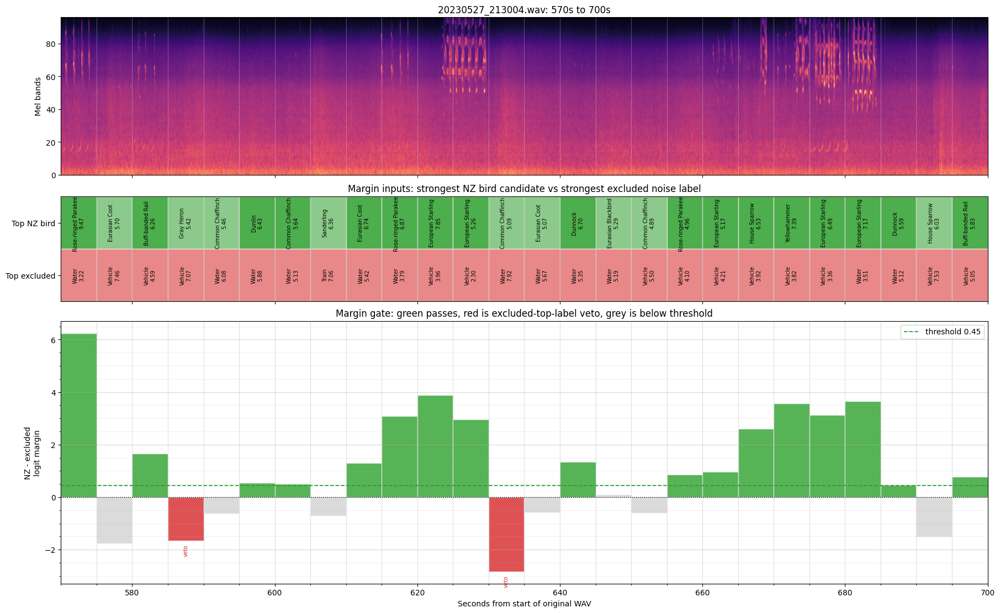

In [134]:
def hz_to_mel(hz):
    return 2595.0 * np.log10(1.0 + hz / 700.0)


def mel_to_hz(mel):
    return 700.0 * (10.0 ** (mel / 2595.0) - 1.0)


def mel_filterbank(sample_rate: int, n_fft: int, n_mels: int = 96, fmin: float = 40.0, fmax: float | None = None):
    fmax = fmax or sample_rate / 2
    mel_points = np.linspace(hz_to_mel(fmin), hz_to_mel(fmax), n_mels + 2)
    hz_points = mel_to_hz(mel_points)
    bin_indexes = np.floor((n_fft + 1) * hz_points / sample_rate).astype(int)
    filters = np.zeros((n_mels, n_fft // 2 + 1), dtype=np.float32)

    for mel_index in range(1, n_mels + 1):
        left, center, right = bin_indexes[mel_index - 1], bin_indexes[mel_index], bin_indexes[mel_index + 1]
        if center == left:
            center += 1
        if right == center:
            right += 1
        for bin_index in range(left, center):
            if 0 <= bin_index < filters.shape[1]:
                filters[mel_index - 1, bin_index] = (bin_index - left) / (center - left)
        for bin_index in range(center, right):
            if 0 <= bin_index < filters.shape[1]:
                filters[mel_index - 1, bin_index] = (right - bin_index) / (right - center)
    return filters


def compute_mel_spectrogram(audio: np.ndarray, sample_rate: int, n_fft: int = 2048, hop_length: int = 512):
    frequencies, times, zxx = stft(
        audio,
        fs=sample_rate,
        nperseg=n_fft,
        noverlap=n_fft - hop_length,
        nfft=n_fft,
        boundary=None,
        padded=False,
    )
    power = np.abs(zxx) ** 2
    filters = mel_filterbank(sample_rate, n_fft)
    mel_power = filters @ power
    mel_db = 10.0 * np.log10(np.maximum(mel_power, 1e-12))
    mel_db -= mel_db.max()
    return times, mel_db


spec_times, mel_db = compute_mel_spectrogram(perch_audio, perch_sample_rate)

fig = plt.figure(figsize=(18, 13), constrained_layout=True)
grid = fig.add_gridspec(nrows=4, ncols=1, height_ratios=[3, 2, 5, 1.4])
ax_spec = fig.add_subplot(grid[0])
ax_compare = fig.add_subplot(grid[1])
ax_margin = fig.add_subplot(grid[2])
ax_buffers = fig.add_subplot(grid[3])

x_min = SECTION_START_SECONDS
x_max = SECTION_START_SECONDS + section_duration_seconds
frame_centers = (frame_df["frame_start_s"] + frame_df["frame_end_s"]) / 2
bar_widths = frame_df["frame_end_s"] - frame_df["frame_start_s"]
extent = [x_min, x_max, 0, mel_db.shape[0]]

ax_spec.imshow(mel_db, origin="lower", aspect="auto", extent=extent, cmap="magma", vmin=-80, vmax=0)
ax_spec.set_xlim(x_min, x_max)
ax_spec.set_ylabel("Mel bands")
ax_spec.set_title(f"{REFERENCE_WAV.name}: {SECTION_START_SECONDS:.0f}s to {SECTION_START_SECONDS + section_duration_seconds:.0f}s")
ax_spec.tick_params(axis="x", labelbottom=False)

comparison_rows = [
    ("top_nz_common_name", "top_nz_logit", "Top NZ bird", "tab:green"),
    ("top_excluded_label", "top_excluded_logit", "Top excluded", "tab:red"),
]
for row_index, (label_column, logit_column, row_name, color) in enumerate(comparison_rows):
    y = len(comparison_rows) - row_index - 1
    for _, row in frame_df.iterrows():
        x = row["frame_start_s"]
        width = row["frame_end_s"] - row["frame_start_s"]
        label = row[label_column]
        logit = row[logit_column]
        active_alpha = 0.85 if row_name == "Top NZ bird" and bool(row["simple_bio_gate"]) else 0.55
        ax_compare.broken_barh(
            [(x, width)],
            (y, 1),
            facecolors=color,
            alpha=active_alpha,
            edgecolors="white",
            linewidth=1.0,
        )
        ax_compare.text(
            x + width / 2,
            y + 0.5,
            f"{label}\n{logit:.2f}",
            ha="center",
            va="center",
            rotation=90,
            fontsize=7,
            color="black",
            clip_on=True,
        )

margin_colors = np.where(
    frame_df["excluded_top_label_gate"],
    "tab:red",
    np.where(frame_df["simple_bio_gate"], "tab:green", "lightgray"),
)
ax_margin.bar(
    frame_centers,
    frame_df["nz_over_excluded_margin"],
    width=bar_widths,
    align="center",
    color=margin_colors,
    alpha=0.8,
    edgecolor="white",
    linewidth=1.0,
)
ax_margin.axhline(BIO_MARGIN_THRESHOLD, color="tab:green", linestyle="--", linewidth=1.3, label=f"threshold {BIO_MARGIN_THRESHOLD:.2f}")
ax_margin.axhline(0.0, color="black", linestyle=":", linewidth=1.0)

for _, row in frame_df.iterrows():
    if bool(row["excluded_top_label_gate"]):
        ax_margin.text(
            (row["frame_start_s"] + row["frame_end_s"]) / 2,
            min(0.0, row["nz_over_excluded_margin"]) - 0.15,
            "veto",
            ha="center",
            va="top",
            rotation=90,
            fontsize=7,
            color="tab:red",
        )

for frame_start in frame_df["frame_start_s"]:
    ax_spec.axvline(frame_start, color="white", alpha=0.25, linewidth=0.8)
    ax_compare.axvline(frame_start, color="black", alpha=0.12, linewidth=0.8)
    ax_margin.axvline(frame_start, color="black", alpha=0.12, linewidth=0.8)
    ax_buffers.axvline(frame_start, color="black", alpha=0.12, linewidth=0.8)
ax_spec.axvline(frame_df["frame_end_s"].iloc[-1], color="white", alpha=0.25, linewidth=0.8)
ax_compare.axvline(frame_df["frame_end_s"].iloc[-1], color="black", alpha=0.12, linewidth=0.8)
ax_margin.axvline(frame_df["frame_end_s"].iloc[-1], color="black", alpha=0.12, linewidth=0.8)
ax_buffers.axvline(frame_df["frame_end_s"].iloc[-1], color="black", alpha=0.12, linewidth=0.8)

ax_compare.set_ylim(0, len(comparison_rows))
ax_compare.set_xlim(x_min, x_max)
ax_compare.set_yticks([1.5, 0.5])
ax_compare.set_yticklabels(["Top NZ bird", "Top excluded"])
ax_compare.tick_params(axis="x", labelbottom=False)
ax_compare.set_title("Margin inputs: strongest NZ bird candidate vs strongest excluded noise label")
ax_compare.grid(axis="x", alpha=0.25)

ax_margin.set_xlim(x_min, x_max)
ax_margin.tick_params(axis="x", labelbottom=False)
ax_margin.set_ylabel("NZ - excluded\nlogit margin")
ax_margin.set_title("Margin gate: green passes, red is excluded-top-label veto, grey is below threshold")
ax_margin.minorticks_on()
ax_margin.grid(axis="y", which="major", alpha=0.45, linewidth=0.9)
ax_margin.grid(axis="y", which="minor", alpha=0.22, linewidth=0.6)
ax_margin.legend(loc="upper right")

if buffer_df.empty:
    ax_buffers.text(
        (x_min + x_max) / 2,
        0.5,
        "No variable buffers proposed",
        ha="center",
        va="center",
        color="dimgray",
    )
else:
    for _, buffer in buffer_df.iterrows():
        ax_buffers.broken_barh(
            [(buffer["buffer_start_s"], buffer["duration_s"])],
            (0, 1),
            facecolors="tab:purple",
            alpha=0.75,
            edgecolors="white",
            linewidth=1.2,
        )
        ax_buffers.text(
            (buffer["buffer_start_s"] + buffer["buffer_end_s"]) / 2,
            0.5,
            f"{int(buffer['buffer_id'])}\n{int(buffer['duration_s'])}s",
            ha="center",
            va="center",
            fontsize=9,
            color="white",
            fontweight="bold",
        )

ax_buffers.set_ylim(0, 1)
ax_buffers.set_xlim(x_min, x_max)
ax_buffers.set_yticks([0.5])
ax_buffers.set_yticklabels(["Saves"])
ax_buffers.set_xlabel("Seconds from start of original WAV")
ax_buffers.set_title(f"Variable buffer sketch: consecutive triggered frames, max {MAX_VARIABLE_BUFFER_FRAMES} frames per save")
ax_buffers.grid(axis="x", alpha=0.25)

plt.show()


## 7. Review Table For Gate Design

Use this table for detailed inspection. The key columns for this margin experiment are `top_nz_common_name`, `top_nz_logit`, `top_excluded_label`, `top_excluded_logit`, `nz_over_excluded_margin`, `excluded_top_label_gate`, `margin_gate`, and `simple_bio_gate`. The companion `buffer_df` table contains the experimental variable-buffer saves drawn in the bottom subplot.

Possible refinements to test next:

- compare the NZ bird candidate against a wider environmental noise set, such as `Wind`, `Ocean`, `Waves_and_surf`, and `Rain`
- require two adjacent frames to pass before retaining a longer clip
- use different margins for common false-positive groups versus high-confidence bird labels
- add an absolute minimum NZ bird logit as a second condition if the margin alone is too permissive


In [135]:
display(
    frame_df.style.format(
        {
            "frame_start_s": "{:.1f}",
            "frame_end_s": "{:.1f}",
            "frame_rms_db": "{:.2f}",
            "overall_top_logit": "{:.3f}",
            "top_nz_logit": "{:.3f}",
            "top_excluded_logit": "{:.3f}",
            "nz_over_excluded_margin": "{:.3f}",
            "bio_margin_threshold": "{:.3f}",
            "top1_logit": "{:.3f}",
            "top2_logit": "{:.3f}",
            "top3_logit": "{:.3f}",
        }
    )
)


,frame_index,frame_start_s,frame_end_s,frame_rms_db,overall_top_label,overall_top_logit,excluded_top_label_gate,top_nz_common_name,top_nz_scientific_name,top_nz_perch_label,top_nz_perch_label_number,top_nz_logit,top_excluded_label,top_excluded_logit,nz_over_excluded_margin,bio_margin_threshold,margin_gate,simple_bio_gate,simple_bio_gate_reason,top1_label,top1_logit,top2_label,top2_logit,top3_label,top3_logit
0,0,570.0,575.0,-23.97,Psittacula krameri,9.465,False,Rose-ringed Parakeet,Psittacula krameri,Psittacula krameri,11404,9.465,Water,3.216,6.249,0.450,True,True,margin_pass,Psittacula krameri,9.465,Ninox scutulata,8.611,Setophaga magnolia,8.426
1,1,575.0,580.0,-21.58,Quiscalus quiscula,7.812,False,Eurasian Coot,Fulica atra,Fulica atra,5246,5.700,Vehicle,7.464,-1.764,0.450,False,False,margin_too_small,Quiscalus quiscula,7.812,Vehicle,7.464,Pandion haliaetus,7.367
2,2,580.0,585.0,-23.32,Dryobates villosus,8.552,False,Buff-banded Rail,Gallirallus philippensis,Gallirallus philippensis,5342,6.263,Vehicle,4.593,1.670,0.450,True,True,margin_pass,Dryobates villosus,8.552,Ninox scutulata,6.936,Gallirallus philippensis,6.263
3,3,585.0,590.0,-22.03,Vehicle,7.073,True,Gray Heron,Ardea cinerea,Ardea cinerea,1096,5.422,Vehicle,7.073,-1.651,0.450,False,False,excluded_top_label,Vehicle,7.073,Alcedo atthis,6.406,Motor_vehicle_(road),5.963
4,4,590.0,595.0,-22.33,Alcedo atthis,8.174,False,Common Chaffinch,Fringilla coelebs,Fringilla coelebs,5228,5.464,Water,6.085,-0.621,0.450,False,False,margin_too_small,Alcedo atthis,8.174,Water,6.085,Anthus trivialis,5.927
5,5,595.0,600.0,-23.04,Calidris alpina,6.426,False,Dunlin,Calidris alpina,Calidris alpina,1987,6.426,Water,5.884,0.542,0.450,True,True,margin_pass,Calidris alpina,6.426,Water,5.884,Strix aluco,5.578
6,6,600.0,605.0,-23.68,Erithacus rubecula,6.669,False,Common Chaffinch,Fringilla coelebs,Fringilla coelebs,5228,5.640,Water,5.128,0.512,0.450,True,True,margin_pass,Erithacus rubecula,6.669,Sylvia atricapilla,6.263,Poecile atricapillus,5.798
7,7,605.0,610.0,-20.93,Loxia curvirostra,7.594,False,Sanderling,Calidris alba,Calidris alba,1986,6.355,Train,7.064,-0.709,0.450,False,False,margin_too_small,Loxia curvirostra,7.594,Train,7.064,Vehicle,6.904
8,8,610.0,615.0,-22.26,Alcedo atthis,8.181,False,Eurasian Coot,Fulica atra,Fulica atra,5246,6.737,Water,5.424,1.313,0.450,True,True,margin_pass,Alcedo atthis,8.181,Fulica atra,6.737,Buteo platypterus,6.282
9,9,615.0,620.0,-21.04,Myiodynastes chrysocephalus,8.379,False,Rose-ringed Parakeet,Psittacula krameri,Psittacula krameri,11404,6.873,Water,3.794,3.080,0.450,True,True,margin_pass,Myiodynastes chrysocephalus,8.379,Sayornis nigricans,8.316,Ninox scutulata,8.067


## 8. Variable Buffer Save Table

This compact table lists the numbered variable-buffer saves shown under the margin plot.


In [ ]:
display(buffer_df)
